In [1]:
import os
import pandas as pd
import numpy as np
import sklearn as sk

pd.options.mode.copy_on_write = True

#https://unctadstat.unctad.org/EN/Classifications/DimSitcRev3Products_Official_Hierarchy.pdf
#Classification SITC:
#0 Food and live animals
#2 Crude inedible materials , no fuels
#3 mineral and fuels
#5 Chemical and related (e.g. medicinal, fertilizers, plastics)
#6 manufactured goods
#8 miscellaneous manufactured aricles (not in 6)
#TOTAL

#files
### trade by coountry see comtradeplus.un.org/TradeBalance
### energy consumption
### education, corruption, rich vs poor, social mobility, ....
###

ISO='TUR'#Turkey
ISO='FRA' #France

#define a column /feature of interest
mycol='Balance' # could be import or export

#define a commodity # code is SITC classification (See above)
commodity='TOTAL'#'0'


#Dir=os.getcwd()
Tfiles=os.listdir('data/Trade/')

Tfiles=sorted(Tfiles,reverse=True)
print(Tfiles)



Df=pd.read_csv('data/Trade/'+Tfiles[0],
               encoding='ISO-8859-1',
               index_col=False #force pandas to not use first columns as index
               )


centroids=pd.read_csv('data/country-centroids.csv')#country center location


features=['refYear',
          'reporterCode','reporterISO','reporterDesc', ##selected country
          'partnerCode','partnerISO','partnerDesc','cmdCode','cmdDesc', #other country
          'primaryValueX','primaryValueM','primaryValueBal'# export, import, balance(export-import)
          ]
Df=Df[features]




###rename some features 
Df.rename(columns={'primaryValueX':'Export',
                   'primaryValueM':'Import',
                   'primaryValueBal':'Balance'},
          inplace=True)


#####deal with imbalance C1->C2 !=-C2_C1!!!!
#todo!!!


def filter_df(df,col,criteria):
    '''filter dataframe according to a column and a criteria
        multiple possible criteria for a column/feature'''
    if not isinstance(criteria,list):
        criteria=[criteria]


    mask=pd.Series(np.full(df.shape[0],False),index=df.index) #add index so  filter can be used on dataframe having specific index (e.g. sub dataframe)
    for i in range(len(criteria)):
        mask+=df[col]==criteria[i]
    out=df[mask]

    return out


iso_ok=centroids['alpha3'].to_list()
Df=filter_df(Df,'reporterISO',iso_ok)
Df=filter_df(Df,'partnerISO',iso_ok+['W00']) #W00=the world


### STEP 0: remove self interaction if it exist
### from previous year? or ? see france ISO='FRA'
# to do on Df!!!
z=[]
for iso in iso_ok:
    #bug=Df[Df[Df['reporterISO']==iso]['partnerISO']==iso]
#bug=filter_df(Df_acountry,'partnerISO',ISO)
    bug=filter_df(filter_df(Df,'reporterISO',iso),'partnerISO',iso)
    if bug.shape[0]>0:
        Df=Df.drop(bug.index,axis=0)
        z.append(bug.reporterISO.unique()[0])#, bug.partnerISO.unique()[0]) )
    
        #print(bug[['reporterISO','partnerISO']].unique())
print(z)
print('---------------')




Df_ref=Df.copy()

#this is all country -> World
Df_world=filter_df(Df,'partnerISO','W00')# this is from countris to World 
Df_world.loc[:,'Amplitude']=Df_world['Export']+Df_world['Import'] # compute country importance
q_world_total=filter_df(Df_world,'cmdCode',[commodity]) #choos a type of marchandise


#show the most important country in exchanges flux (eg.  amplitude=export+import!)
q_sorted=q_world_total.sort_values(by='Amplitude',key=lambda x: np.abs(x),ascending=False)
q_sorted[['reporterISO','Export','Import', 'Balance', 'Amplitude']].head(10)


['TradeBalance_2024.csv', 'TradeBalance_2023.csv', 'TradeBalance_2022.csv', 'TradeBalance_2021.csv']
['ARG', 'AUS', 'AZE', 'BRB', 'BEL', 'BFA', 'BGR', 'BOL', 'BRA', 'CAN', 'CHL', 'CHN', 'DOM', 'EST', 'FJI', 'FRA', 'GBR', 'GTM', 'IRL', 'IND', 'LUX', 'MDV', 'MYS', 'NZL', 'PAN', 'SVN', 'SVK', 'SUR', 'SLV', 'THA', 'TTO', 'ZAF']
---------------


,reporterISO,Export,Import,Balance,Amplitude
30528,CHN,3.576543e+12,2.585135e+12,9.914087e+11,6.161678e+12
84496,USA,2.063803e+12,3.356813e+12,-1.293010e+12,5.420615e+12
37753,DEU,1.683517e+12,1.423247e+12,2.602700e+11,3.106764e+12
25114,JPN,7.073901e+11,7.426715e+11,-3.528144e+10,1.450062e+12
47291,FRA,6.459590e+11,7.620446e+11,-1.160856e+11,1.408004e+12
69571,NLD,7.222943e+11,6.354086e+11,8.688570e+10,1.357703e+12
49310,HKG,6.394106e+11,6.979039e+11,-5.849332e+10,1.337314e+12
86386,GBR,5.086854e+11,8.092058e+11,-3.005204e+11,1.317891e+12
76357,KOR,6.831270e+11,6.317271e+11,5.139988e+10,1.314854e+12
71420,ITA,6.748736e+11,6.155991e+11,5.927451e+10,1.290473e+12


In [2]:
#####################################make a map of countries balance with the world

import plotly.express as px
import folium
from IPython.display import display
import matplotlib.pyplot as plt


lat0=0
lon0=0
#see https://realpython.com/python-folium-web-maps-from-data/
m=folium.Map(location=[lat0,lon0],tiles='cartodb positron',zoom_start=2)


political_countries_url = ("http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson")
folium.GeoJson(political_countries_url).add_to(m)

#make bins to have a centered 0 map; 
min=q_world_total[mycol].min()
max=q_world_total[mycol].max()
bin_extrem=np.max([np.abs(min),np.abs(max)])

bin_space=np.linspace(start=-bin_extrem,
                      stop=bin_extrem,
                      num=6+1)#num is number of borders=number of bin+1
#print(bin_space)
folium.Choropleth(
    geo_data=political_countries_url,
    data=q_world_total,
    columns=('reporterISO', mycol),
    key_on="feature.properties.su_a3",
    bins=bin_space,
    fill_color="RdYlGn",
    fill_opacity=0.4,
    line_opacity=0.3,
    nan_fill_color="white",
    legend_name=f'Word {mycol} ',#add for which material; make conversion{commodity} to true meaning!",
).add_to(m)

display(m)

m.save('test.html')



In [3]:
############################################################################################################
############################################################################################################
############################################################################################################
##################quantity reported by sender is not equal to quantity reported by receiver ################

####-> see example betwenn USA and CHINA
## one possible reason is transport time required for shipping. 
## example : leaving china in december means arriving in usa next year
ISO1='USA'
ISO2='CHN'
iso1toiso2=Df[(Df['reporterISO']==ISO1) & (Df['partnerISO']==ISO2)]
iso2toiso1=Df[(Df['reporterISO']==ISO2) & (Df['partnerISO']==ISO1)]

pd.concat([iso1toiso2,iso2toiso1]).sort_values(by='cmdDesc')[['cmdDesc','reporterISO','partnerISO','Export','Import','Balance']]



,cmdDesc,reporterISO,partnerISO,Export,Import,Balance
85553,All Commodities,USA,CHN,1.435457e+11,4.626203e+11,-3.190746e+11
32733,All Commodities,CHN,USA,5.256488e+11,1.645909e+11,3.610579e+11
83095,"Chemicals and related products, n.e.s.",USA,CHN,2.735592e+10,2.677563e+10,5.802896e+08
28300,"Chemicals and related products, n.e.s.",CHN,USA,2.483700e+10,2.811632e+10,-3.279328e+09
82405,"Crude materials, inedible, except fuels",USA,CHN,2.327120e+10,1.541804e+09,2.172940e+10
25949,"Crude materials, inedible, except fuels",CHN,USA,1.332074e+09,2.472787e+10,-2.339579e+10
81942,Food and live animals,USA,CHN,9.660305e+09,5.343295e+09,4.317010e+09
24500,Food and live animals,CHN,USA,6.867925e+09,1.163686e+10,-4.768930e+09
83460,Manufactured goods classified chiefly by material,USA,CHN,5.422528e+09,5.168672e+10,-4.626419e+10
29936,Manufactured goods classified chiefly by material,CHN,USA,6.113286e+10,6.411599e+09,5.472126e+10


In [4]:
#Df=Df_ref
def harmonize_export_import(Df,ISO1,ISO2):
    cmds=Df['cmdCode'].unique()
    #print(cmds)
    for cmd in cmds:
        q1to2=Df[(Df['reporterISO']==ISO1) & (Df['partnerISO']==ISO2) & (Df['cmdCode']==cmd)]
        q2to1=Df[(Df['reporterISO']==ISO2) & (Df['partnerISO']==ISO1) & (Df['cmdCode']==cmd)]
        if len(q1to2)>0 and len(q2to1)>0:#only if '1 to 2' and '2 to 1' exist
            e_12=q1to2['Export'].values[0]
            e_21=q2to1['Export'].values[0]
            i_12=q1to2['Import'].values[0]
            i_21=q2to1['Import'].values[0]

            ### what is exported by '1 to 2' is imported by '2 from 1' !
            expor=(e_12+i_21)/2
            impor=(e_21+i_12)/2
            Df.loc[q1to2.index,'Export']=expor
            Df.loc[q2to1.index,'Export']=impor
            Df.loc[q1to2.index,'Import']=impor
            Df.loc[q2to1.index,'Import']=expor


        if len(q1to2)>0 and len(q2to1)==0:
            #export import from 1 to 2 is known but but 2to1 is not. so here export2to1=import1to2
            cmdes=q1to2['cmdDesc'].values[0]
            e_12=q1to2['Export'].values[0]
            i_12=q1to2['Import'].values[0]
            e_21=i_12
            i_21=e_12
            newdic={'reporterISO':ISO2,'partnerISO':ISO1,'cmdDesc':cmdes,'cmdCode':cmd,'Export':e_21,'Import':i_21}
            newlign=pd.DataFrame([newdic])
            Df=pd.concat([Df,newlign],ignore_index=True)
            


        if len(q2to1)>0 and len(q1to2)==0:
            #export import from 2 to 1 is known but but 1to2 is not. so here export1to2=import2to1
            cmdes=q2to1['cmdDesc'].values[0]
            e_21=q2to1['Export'].values[0]
            i_21=q2to1['Import'].values[0]
            e_12=i_21
            i_12=e_21              
            newdic={'reporterISO':ISO1,'partnerISO':ISO2,'cmdDesc':cmdes,'cmdCode':cmd,'Export':e_12,'Import':i_12}
            newlign=pd.DataFrame([newdic])
            Df=pd.concat([Df,newlign],ignore_index=True)

    #recalculate Balance
    Df['Balance']=Df['Export']-Df['Import']
    
    return Df

#ISO1='FRA';ISO2='TUN' # test 1to2 known but not 2to1
#ISO1='TUN';ISO2='FRA' # test 2to1 known but not 2to1

Df=harmonize_export_import(Df,ISO1,ISO2)

#show example after correction/harmonization
iso1toiso2=Df[(Df['reporterISO']==ISO1) & (Df['partnerISO']==ISO2)]
iso2toiso1=Df[(Df['reporterISO']==ISO2) & (Df['partnerISO']==ISO1)]
pd.concat([iso1toiso2,iso2toiso1]).sort_values(by='cmdDesc')[['cmdDesc','cmdCode','reporterISO','partnerISO','Export','Import','Balance']]


,cmdDesc,cmdCode,reporterISO,partnerISO,Export,Import,Balance
85553,All Commodities,TOTAL,USA,CHN,1.540683e+11,4.941346e+11,-3.400663e+11
32733,All Commodities,TOTAL,CHN,USA,4.941346e+11,1.540683e+11,3.400663e+11
83095,"Chemicals and related products, n.e.s.",5,USA,CHN,2.773612e+10,2.580631e+10,1.929809e+09
28300,"Chemicals and related products, n.e.s.",5,CHN,USA,2.580631e+10,2.773612e+10,-1.929809e+09
82405,"Crude materials, inedible, except fuels",2,USA,CHN,2.399953e+10,1.436939e+09,2.256259e+10
25949,"Crude materials, inedible, except fuels",2,CHN,USA,1.436939e+09,2.399953e+10,-2.256259e+10
81942,Food and live animals,0,USA,CHN,1.064858e+10,6.105610e+09,4.542970e+09
24500,Food and live animals,0,CHN,USA,6.105610e+09,1.064858e+10,-4.542970e+09
83460,Manufactured goods classified chiefly by material,6,USA,CHN,5.917064e+09,5.640979e+10,-5.049273e+10
29936,Manufactured goods classified chiefly by material,6,CHN,USA,5.640979e+10,5.917064e+09,5.049273e+10


In [5]:
import itertools
import time 
from joblib import Parallel, delayed, parallel_config

#a quick test on itertools combinations
list1 = ['A', 'B', 'C','D']
# Generate all combinations using itertools.product
combinations = list(itertools.combinations(list1, 2))
print(combinations)

pairs=list(itertools.combinations(iso_ok,2))
print(f'there is {len(pairs)} pairs')

pairs[0]=('USA','CHN') #for test, enforce a known situation
n=100#see how long it takes for n examples

Df=Df_ref.copy()
ti=time.time()
for ISO1,ISO2 in pairs[0:n]:
    harmonize_export_import(Df,ISO1,ISO2)
tf=time.time()
elapsed0=tf-ti

Df=Df_ref.copy()
ti=time.time()
#seehttps://joblib.readthedocs.io/en/latest/parallel.html
#note on joblib backend: 'loky'= 30; 'threading'=90mn
#other note : loky backedn+ default mmap_mode 'r' provok error 'ValueError: assignment destination is read-only'
with parallel_config(backend='loky',mmap_mode='r+', n_jobs=-1): # -1 use all processors (=24 logical processors)
    results=Parallel()(delayed(harmonize_export_import)(Df,ISO1,ISO2) for ISO1,ISO2 in pairs[0:n]  )                     
tf=time.time()
elapsed=tf-ti


print(f'no parallel, time required to harmonize all pairs is  {len(pairs)/n*elapsed0/60:.0f} mn')
print(f'with parallel, time required to harmonize all pairs is  {len(pairs)/n*elapsed/60:.0f} mn')

# ##check if parallel computing work ...............fail ... new values are added but old one are kept!
# #show example after correction/harmonization
Df=pd.concat(results)
Df.drop_duplicates(inplace=True)
ISO1,ISO2=('USA','CHN')
iso1toiso2=Df[(Df['reporterISO']==ISO1) & (Df['partnerISO']==ISO2)]
iso2toiso1=Df[(Df['reporterISO']==ISO2) & (Df['partnerISO']==ISO1)]
pd.concat([iso1toiso2,iso2toiso1]).sort_values(by='cmdDesc')[['cmdDesc','reporterISO','partnerISO','Export','Import','Balance']]

[('A', 'B'), ('A', 'C'), ('A', 'D'), ('B', 'C'), ('B', 'D'), ('C', 'D')]
there is 29890 pairs
no parallel, time required to harmonize all pairs is  106 mn
with parallel, time required to harmonize all pairs is  32 mn


,cmdDesc,reporterISO,partnerISO,Export,Import,Balance
32733,All Commodities,CHN,USA,4.941346e+11,1.540683e+11,3.400663e+11
85553,All Commodities,USA,CHN,1.540683e+11,4.941346e+11,-3.400663e+11
85553,All Commodities,USA,CHN,1.435457e+11,4.626203e+11,-3.190746e+11
32733,All Commodities,CHN,USA,5.256488e+11,1.645909e+11,3.610579e+11
83095,"Chemicals and related products, n.e.s.",USA,CHN,2.773612e+10,2.580631e+10,1.929809e+09
28300,"Chemicals and related products, n.e.s.",CHN,USA,2.580631e+10,2.773612e+10,-1.929809e+09
82405,"Crude materials, inedible, except fuels",USA,CHN,2.399953e+10,1.436939e+09,2.256259e+10
25949,"Crude materials, inedible, except fuels",CHN,USA,1.436939e+09,2.399953e+10,-2.256259e+10
81942,Food and live animals,USA,CHN,1.064858e+10,6.105610e+09,4.542970e+09
24500,Food and live animals,CHN,USA,6.105610e+09,1.064858e+10,-4.542970e+09


In [6]:
import networkx as nx

#########################now analysw country to country; 'world' is not longer a partner
Df=Df_ref.copy()
Df=filter_df(Df,'partnerISO',iso_ok) #


####find all pairs... this means also trying reverse as FRA->TUN exist byt TUN->FRA does not!
####redo find_topN_relations?? 

def find_topN_relations(Df,ISO,n):
    Df_acountry=filter_df(Df,'reporterISO',ISO)
    Df_country_marchandise=filter_df(Df_acountry,'cmdCode',[commodity]) #choos a type of marchandise
    q_sorted=Df_country_marchandise.sort_values(by=mycol,key=lambda x: np.abs(x),ascending=False)# sorted according to abs(mycol) but keep value in mycol!
    Q_pos=q_sorted[q_sorted[mycol]>0].head(n) 
    Q_neg=q_sorted[q_sorted[mycol]<0].head(n)

    return Q_neg,Q_pos


### STEP 1: find the top 10 >0 and top 10<0 countries for a given marchandise 
n=6# number is arbitrary#### find a way to get x% variance ; later
Q_neg,Q_pos=find_topN_relations(Df,ISO,n)
Q=pd.concat([Q_pos,Q_neg])
pairs=[]
for i in range(len(Q)):
    pairs.append( (Q['reporterISO'].values[0],Q['partnerISO'].values[0]) )
print(f'there are {len(pairs)} pairs')

### STEP 2: harmonize
#implement parallel computing here.... but previous test fail as output is wrong :(
for ISO1,ISO2 in pairs:
    Df=harmonize_export_import(Df,ISO1,ISO2) #must be done on Df as it have all pairs
    
### STEP 3:  redo STEP 1 but with corrected information
Q_neg,Q_pos=find_topN_relations(Df,ISO,n)


#show example after correction/harmonization
iso1toiso2=Df[(Df['reporterISO']==ISO1) & (Df['partnerISO']==ISO2)]
iso2toiso1=Df[(Df['reporterISO']==ISO2) & (Df['partnerISO']==ISO1)]
pd.concat([iso1toiso2,iso2toiso1]).sort_values(by='cmdDesc')[['cmdDesc','reporterISO','partnerISO','Export','Import','Balance']]



there are 12 pairs


,cmdDesc,reporterISO,partnerISO,Export,Import,Balance
50216,All Commodities,FRA,GBR,3.947508e+10,2.870219e+10,1.077289e+10
86417,All Commodities,GBR,FRA,2.870219e+10,3.947508e+10,-1.077289e+10
44041,"Chemicals and related products, n.e.s.",FRA,GBR,6.570533e+09,5.106368e+09,1.464165e+09
83914,"Chemicals and related products, n.e.s.",GBR,FRA,5.106368e+09,6.570533e+09,-1.464165e+09
40034,"Crude materials, inedible, except fuels",FRA,GBR,3.596509e+08,2.657057e+08,9.394518e+07
83194,"Crude materials, inedible, except fuels",GBR,FRA,2.657057e+08,3.596509e+08,-9.394518e+07
37071,Food and live animals,FRA,GBR,4.346872e+09,3.712236e+09,6.346359e+08
83225,Food and live animals,GBR,FRA,3.712236e+09,4.346872e+09,-6.346359e+08
45874,Manufactured goods classified chiefly by material,FRA,GBR,3.492277e+09,2.519108e+09,9.731689e+08
85273,Manufactured goods classified chiefly by material,GBR,FRA,2.519108e+09,3.492277e+09,-9.731689e+08


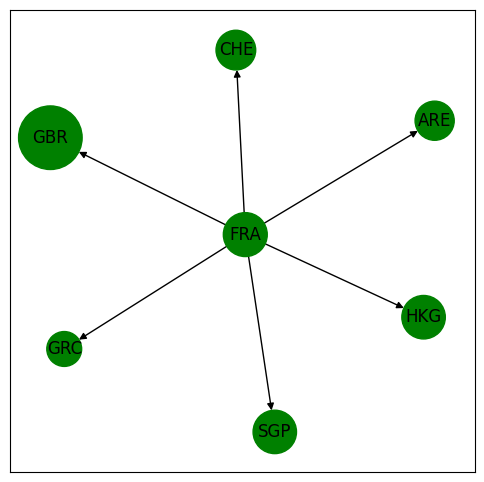

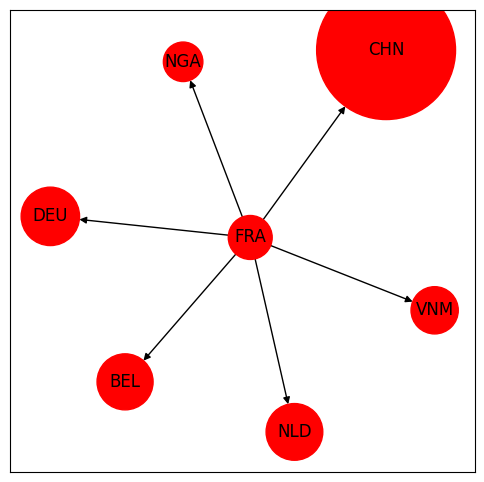

In [7]:
#####transform dataframe into network and visualize

G_pos=nx.from_pandas_edgelist(Q_pos[['reporterISO','partnerISO',mycol]],
                          'reporterISO','partnerISO',
                          edge_attr=mycol,#!!!!! this add the value in mycol
                          create_using=nx.DiGraph())


G_neg=nx.from_pandas_edgelist(Q_neg[['reporterISO','partnerISO',mycol]],
                          'reporterISO','partnerISO',
                          edge_attr=mycol,#!!!!! this add the value in mycol
                          create_using=nx.DiGraph())

val_pos=list(Q_pos[mycol].astype('float'))
val_neg=list(Q_neg[mycol].astype('float').abs())             

maxval=np.max(val_pos+val_neg)# +: concat list1 to list2
norm=maxval/1e4


a=6
plt.figure(figsize=(a, a))
nx.draw_networkx(G_pos,node_size=[1e3]+list(val_pos/norm),node_color='g')


plt.figure(figsize=(a, a))
nx.draw_networkx(G_neg,node_size=[1e3]+list(val_neg/norm),node_color='r')
#nx.draw_networkx(G_neg,node_size=1e3,node_color='r')

#print((G_pos.number_of_edges()))
#print((G_neg.number_of_edges()))


[[  -50206.75436837  -409335.19142604        0.        ]
 [ 4588726.58883788  -868972.88771394        0.        ]
 [ 4814917.01584141   878715.50942491        0.        ]
 [-5480835.39248016  -634890.4911363         0.        ]
 [-5503269.082443    -449623.08586374        0.        ]
 [ 1480410.16025098  -395253.09663978        0.        ]
 [ 3317872.52930675   255253.4032764         0.        ]
 [-5903501.50459178  -510671.74183262        0.        ]
 [ 1688850.07924614 -5207391.16605296        0.        ]
 [              nan               nan               nan]]
fail for Argentina (last lign)


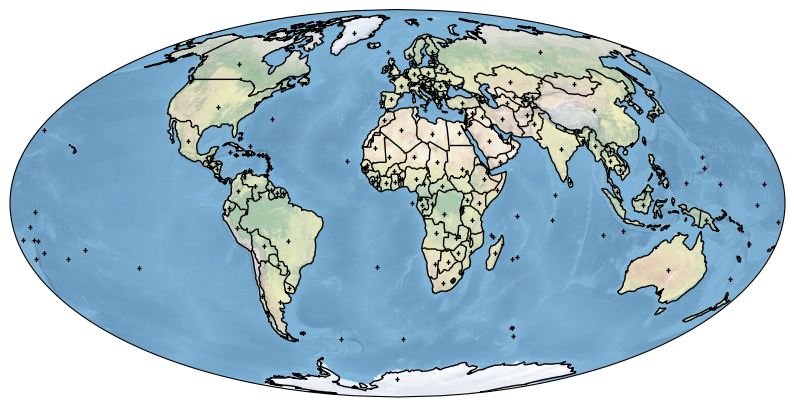

In [8]:

################GOAL is now to put those network on a map

#first do some tests with cartopy !basemap depreciated :(
#idea from https://towardsdatascience.com/visualizing-geospatial-network-graphs-using-basemap-and-mplleaflet-76a7f3d0c923/
# use cartopy intead
import cartopy.crs as ccrs
import cartopy.feature as cfeature


#country centroid lat,lon from https://github.com/komsitr/country-centroid
pos0=centroids[['longitude','latitude','alpha3']].set_index('alpha3').T.to_dict('list')
lon0 = pos0[ISO][0]
lat0 = pos0[ISO][1]



crs_longlat = ccrs.epsg(3857)#ccrs.PlateCarree() 
map=ccrs.Orthographic(central_longitude=lon0, central_latitude=lat0)

# #lat,lon conversion in Basemap coordinates
pp = map.transform_points(ccrs.PlateCarree(),
                            centroids['longitude'].values,
                            centroids['latitude'].values)
print(pp[0:10])
print('fail for Argentina (last lign)')


#give some nan as:
# map.transform_point(crs_longlat,-63.616672,-38.416097)#argentina

# #fig,ax=plt.subplot(1,1,1)
# pp=ax.plot(                centroids['longitude'].values,
#                             centroids['latitude'].values,
#                             transform=ccrs.PlateCarree())

#fig,ax=plt.subplot(1,1,1, transform=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.PlateCarree())
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.stock_img()
# ax.plot(centroids['longitude'].values,             
#         centroids['latitude'].values,
#         marker='o',linestyle='')
# plt.show()

def make_map():
    fig = plt.figure(figsize=(10, 10))
    #proj = ccrs.Orthographic(central_longitude = 0, central_latitude = 0)
    proj = ccrs.Mollweide(central_longitude = 0)
    ax = plt.axes(projection=proj)
    #ax.set_extent((-85,70,36,145),crs=ccrs.PlateCarree())
    # Set up the background
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ax.stock_img()
    plt.plot(centroids['longitude'].values,
             centroids['latitude'].values,
             color='black', linestyle='', marker='+', markersize=3, 
             transform=ccrs.PlateCarree())
    fig.show#why not()??
    
make_map()



In [9]:
#G=G_pos.copy()
G=nx.compose(G_neg,G_pos)

for edge in list(G.edges()):
    print(edge,f' {G.edges()[edge]}')

#print(list(G.nodes()))

###2 solutions heres positions as new dictionary OR position as node attribute
#solution1: give positions to nodes :add attribute
#for node in list(G.nodes):
#    G.nodes[node]['pos']=pos0[node]

#solution2: position as new dictionary
G.position={}
for node in list(G.nodes):
    G.position[node]=pos0[node]


#note: nx.set_node_attributes(...)# failed, ... because?


('FRA', 'CHN')  {'Balance': -51434463768.464005}
('FRA', 'DEU')  {'Balance': -9092468274.363998}
('FRA', 'NLD')  {'Balance': -8567635887.075001}
('FRA', 'BEL')  {'Balance': -8369059642.4489975}
('FRA', 'VNM')  {'Balance': -5949067487.195}
('FRA', 'NGA')  {'Balance': -4159494318.4309998}
('FRA', 'GBR')  {'Balance': 10772891373.251007}
('FRA', 'HKG')  {'Balance': 5038588626.6710005}
('FRA', 'SGP')  {'Balance': 5023154177.882999}
('FRA', 'CHE')  {'Balance': 4198670797.7610016}
('FRA', 'ARE')  {'Balance': 4085139890.747}
('FRA', 'GRC')  {'Balance': 3237632280.167}


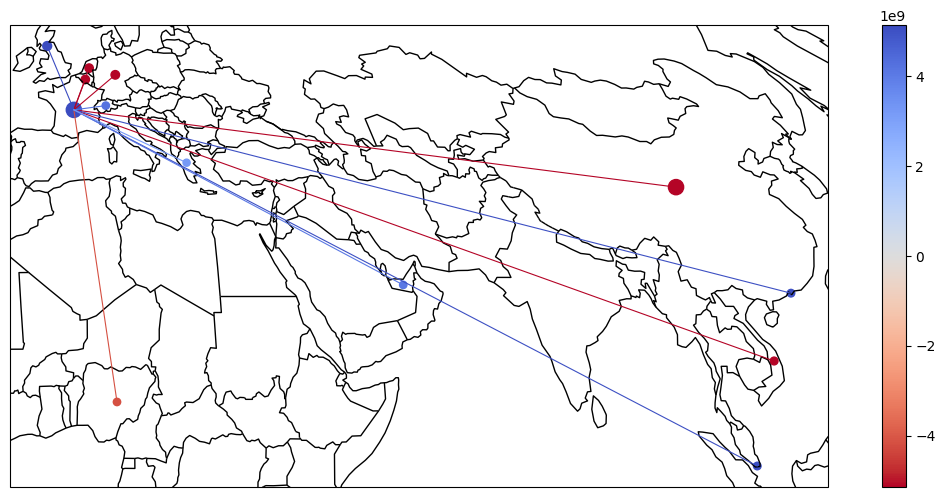

In [10]:

###problem nx.draw_networkx fail because of projection!!! so it can not be used
import matplotlib as mpl

cmap=plt.cm.coolwarm_r


node_c='byvalue'
node_s='byvalue'
edge_c='byvalue'
edge_s=None


fig = plt.figure(figsize=(14, 6))
#proj = ccrs.Orthographic(central_longitude = lon0, central_latitude = lat0)
proj = ccrs.Mollweide(central_longitude = lon0)
#proj=ccrs.PlateCarree()
ax = plt.axes(projection=proj)
#ax.set_extent((-150,160,-36,80),crs=ccrs.PlateCarree()) ####this modify G somehow!!! very weird
# Set up the background
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)


############chose an attribute attr and get values
attr='Balance'
values=[G.edges()[e][attr] for e in G.edges()] #this is ok for 'level 1' network (no intermediate layer) 
max_val=np.max(np.abs(values))

#############color
color_norm = mpl.colors.Normalize(vmin=-max_val/10, vmax=max_val/10)

#############node color
if node_c is None:
    node_color='k'

if node_c=='byvalue':
    #give an edge value to a node!! first node has no values so add one
    node_color=cmap(color_norm([max_val]+values ))

if node_c=='bysign':
    val_sign=np.sign( [1]+values)
    node_color=[ 'green' if v>0 else 'red' for v in val_sign ]

#############node size
if node_s is None:
    node_size=28

if isinstance(node_s,int):
    node_size=node_s

if node_s=='byvalue':
    node_size=np.abs([max_val]+values)
    node_size=node_size/max_val*100+20



#############edge color
if edge_c is None:
    edge_color='k'

if edge_c=='byvalue':
    #give an edge value to a node!! first node has no values so add one
    edge_color=cmap(color_norm(values))
          

if edge_c=='bysign':
    val_sign=np.sign(values)
    edge_color=[ 'green' if v>0 else 'red' for v in val_sign ] #color (r,g,b) between 0 and1


#############edge size
if edge_s is None:
    edge_size=.8

if isinstance(node_s,float):
    edge_size=node_s

if edge_s=='byvalue':
    edge_size=np.abs(values)  #this is the amplitude; needed?
    edge_size=edge_size/np.max(edge_size)*4           


#plot nodes
nodelist=list(G)
xy = np.array([G.position[v] for v in nodelist])
#print(xy[:,0]) #ok this is G.node_lon but as list; as expected

#print(len(node_size))
#print(len(xy))
#np.array(...) to be able to have color[i] is for position[i] (vectorization)
ax.scatter(x=np.array(xy[:,0]),
           y=np.array(xy[:,1]),
           s=node_size,#this is node size!
           linestyle='',
           marker='o',
           c=np.array(node_color), # this is color
           transform=ccrs.PlateCarree(),
            )



edgelist=list(G.edges())
i=0
##plot each pair separately ; np.array trick does not work here
#edge
for edge in edgelist: 
    edge_coords = np.array([G.position[v] for v in edge])
    
    if edge_s=='byvalue':
        size=edge_size[i]
    else:
        size=edge_size

    if edge_c is None:
        c=edge_color
    else:
        c=edge_color[i]            

    ax.plot(
        edge_coords[:, 0],
        edge_coords[:, 1],
        transform=ccrs.PlateCarree(),
        linewidth=size,
        color=c
        )
    i=i+1
 

if (node_c=='byvalue' or edge_c=='byvalue'):
    fig.colorbar(mpl.cm.ScalarMappable(norm=color_norm,cmap=cmap),
                ax=ax)



In [11]:
def find_topN_neg_pos(Df,ISO,n,absolute=None):
    
    Df_acountry=filter_df(Df,'reporterISO',ISO)
    Df_country_marchandise=filter_df(Df_acountry,'cmdCode',[commodity]) #choos a type of marchandise
    q_sorted=Df_country_marchandise.sort_values(by=mycol,key=lambda x: np.abs(x),ascending=False)# sorted according to abs(mycol) but keep value in mycol!
    Q_pos=q_sorted[q_sorted[mycol]>0].head(n) 
    Q_neg=q_sorted[q_sorted[mycol]<0].head(n)

    return Q_neg,Q_pos



def make_network(Df,central_ISO,n_nodes,n_level):
    '''on Df_product'''

# step 1 : find all pairs... this means also trying reverse as FR->TUN exist byt TUN->FR does not!
# step 2 : harmonize the connections
# step 3 : retrieve informations

### STEP 1 :find all connection of interest (pairs)
    queue_ISO=[central_ISO]
    passed_ISO=[]
    pairs=[]

    i=0
    while i<n_level:
        for ISO in list(queue_ISO):
            #print('actual queue',queue_ISO)
            #print('current ISO:', ISO)

            Df_neg,Df_pos=find_topN_neg_pos(Df,ISO,n_nodes)
            pos_ISO=Df_pos['partnerISO'].to_list()
            neg_ISO=Df_neg['partnerISO'].to_list()

            new_ISO=pos_ISO+neg_ISO
            for iso in new_ISO:
                queue_ISO.append(iso)

            passed_ISO.append(ISO) #all the country already seen
            for iso in passed_ISO:
                if iso in queue_ISO:
                    queue_ISO.remove(iso)

            #print(f'{ISO} has positive balance with {pos_ISO}')
            #print(f'{ISO} has negative balance with {neg_ISO}')
            #print('passed queue', passed_ISO)        
        
            new_pairs=list(zip([ISO]*n_nodes*2, pos_ISO+neg_ISO))
            #print('new pairs',new_pairs)
            for pair in new_pairs:
                pairs.append(pair)

        i+=1                   

### STEP 2 :harmonize
    for ISO1, ISO2 in pairs:
        Df=harmonize_export_import(Df,ISO1,ISO2)


### STEP 3: 
# repeat queue and while algorithms... OR take advantage  of knowing pairs (established in step1)
    G_pos = nx.DiGraph()
    G_neg = nx.DiGraph()

    for ISO1,ISO2 in pairs:
        df_reporter=filter_df(Df,'reporterISO',ISO1)
        df_=filter_df(df_reporter,'partnerISO',ISO2)
        #print(df_)
        g=nx.from_pandas_edgelist(  df_[['reporterISO','partnerISO',mycol]],
                                        'reporterISO','partnerISO',
                                        edge_attr=mycol,
                                        create_using=nx.DiGraph()
                                        )
        if df_[mycol].values[0]>0:
            G_pos.update(g)
        else:    
            G_neg.update(g)

    return G_pos,G_neg


Df_product=filter_df(Df,'cmdCode',[commodity])

G_pos,G_neg=make_network(Df_product,central_ISO=ISO,n_nodes=2,n_level=3)



In [12]:
G=nx.compose(G_neg,G_pos)

#####simplify G
#ex USAtoCHN = -CHNtoUSA remove the positive link

# for edge in list(G.edges()):
#     print(edge,f' {G.edges()[edge]}')

#note : remove one case when connexion is repeated, such as (FRA->DEU | DEU->FRA)
# ok but it remove edge having >=1 repetition
for edge in list(G.edges()):
    reverse_edge=edge[::-1]
    if (edge in list(G.edges()) and reverse_edge in list(G.edges())) : # both edge and reverse edge must exist before eventual removing.
        #print(reverse_edge,f' {G.edges()[reverse_edge]}')
        G.remove_edge(reverse_edge[0],reverse_edge[1])
        #print((G.edges()))

for edge in list(G.edges()):
    value= G.edges()[edge][mycol]
    if value<0:
        #print(edge, G.edges()[edge])
        G.remove_edge(edge[0],edge[1])
        G.add_edge(edge[1],edge[0],**{mycol:-value})
        #print(edge[::-1], G.edges()[edge[::-1]])



figure : with node location according to geospatial location, without map behind


c:\Users\juano\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\networkx\drawing\layout.py:1809: RuntimeWarning: invalid value encountered in divide
  attraction = -np.log(1 + distance) / distance


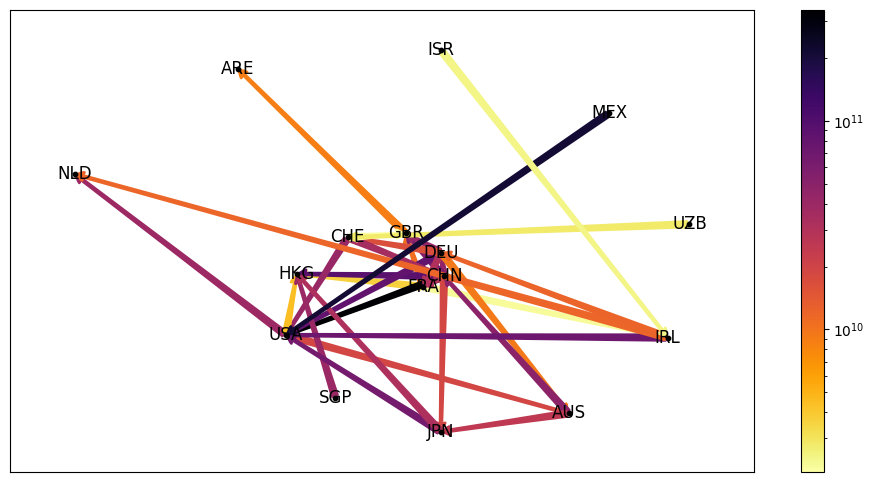

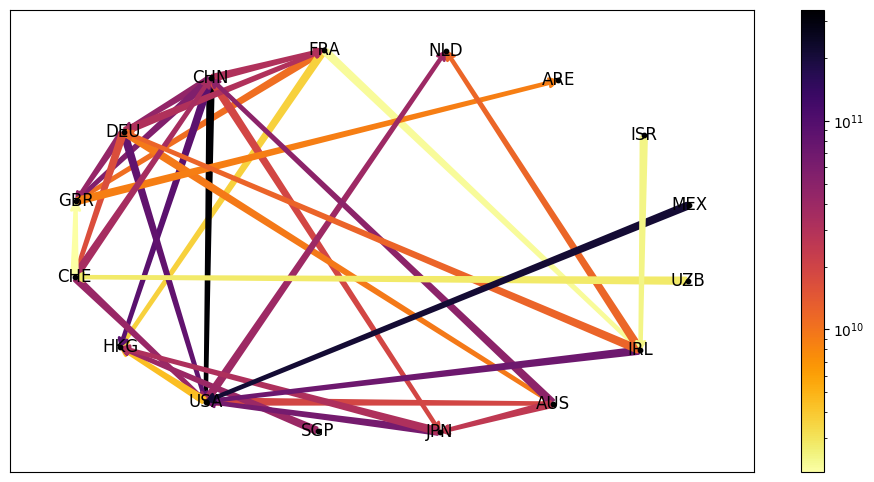

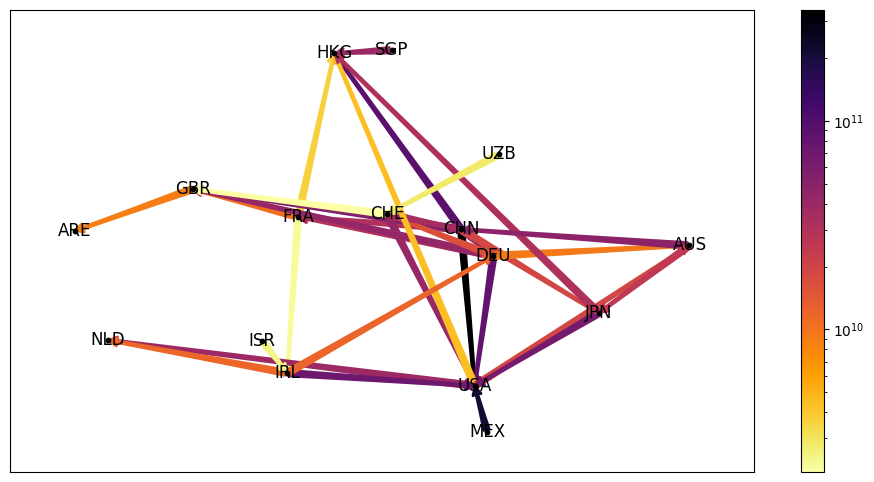

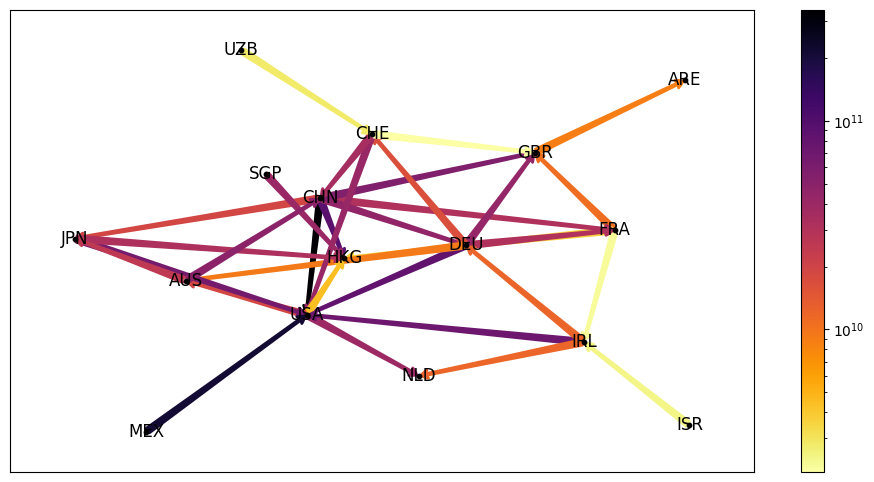

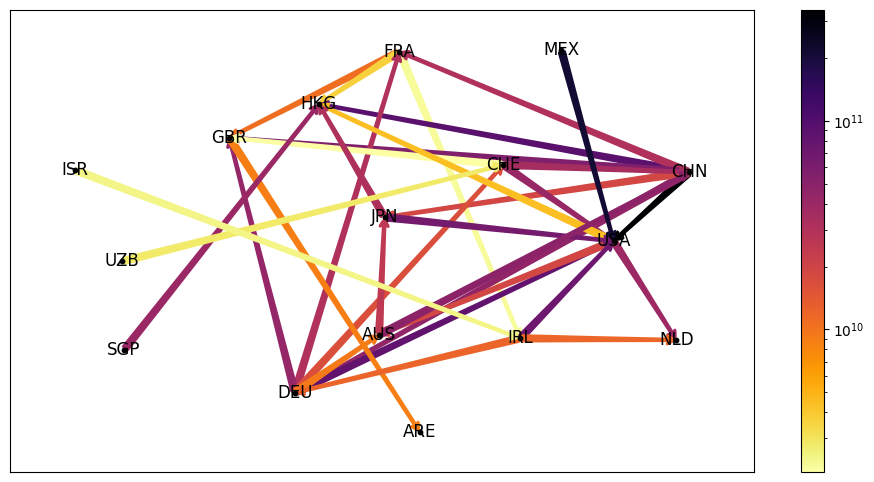

In [ ]:
from matplotlib.patches import ArrowStyle

cmap=cmap=plt.cm.inferno_r

def network_figure(G,pos,cmap):
    Size=[G.edges[pair][mycol] for pair in list(G.edges())]
    min_val=np.min(np.abs(Size))
    max_val=np.max(np.abs(Size))
    Size=Size/max_val
    Size=np.log10(Size)

    fig,ax=plt.subplots(figsize=(12,6))
    net=nx.draw_networkx(G,
                        edge_cmap=cmap,
                        edge_color=Size,
                        node_color='k',
                        node_size=10,
                        width=2,#Size*4,
                        arrowstyle=ArrowStyle('fancy',head_length=.5, head_width=.6, tail_width=0.4),
                        #arrowstyle=ArrowStyle('wedge', tail_width=.3,shrink_factor=.8),
                        #arrowstyle=ArrowStyle('->',widthA=10,widthB=1,head_width=10),#does not change width..
                        pos=pos
                        )


    color_norm = mpl.colors.LogNorm(vmin=min_val, vmax=max_val)
    fig.colorbar(mpl.cm.ScalarMappable(norm=color_norm,cmap=cmap),
                ax=ax)


#network_figure(G,pos0,cmap)

# print('figure : with rearangment on node location')
#network_figure(G,nx.spring_layout(G,k=3,seed=42),cmap)

#network_figure(G,nx.spectral_layout(G,center=pos0[ISO],weight=1/100),cmap)

network_figure(G,nx.spiral_layout(G,center=pos0[ISO],resolution=.6),cmap)

network_figure(G,nx.shell_layout(G,center=pos0[ISO],rotate=45/np.pi),cmap)

network_figure(G,nx.forceatlas2_layout(G,dissuade_hubs=True,linlog=True,distributed_action=True,seed=42),cmap)

network_figure(G,nx.kamada_kawai_layout(G),cmap)#!

network_figure(G,nx.arf_layout(G,a=1.4,seed=42),cmap)

###bug file not found make_network_figure(G,nx.nx_pydot.graphviz_layout(G),cmap)
##error G is not planar make_network_figure(G,nx.planar_layout(G,center=pos0[ISO]),cmap)

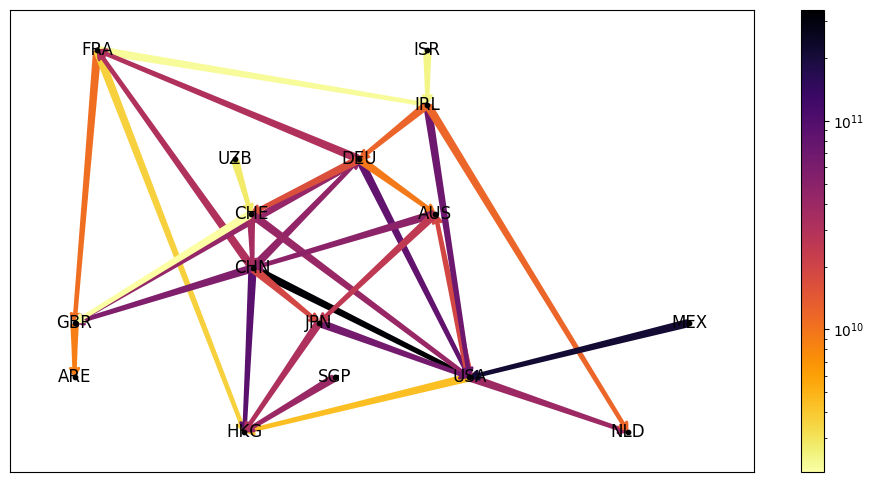

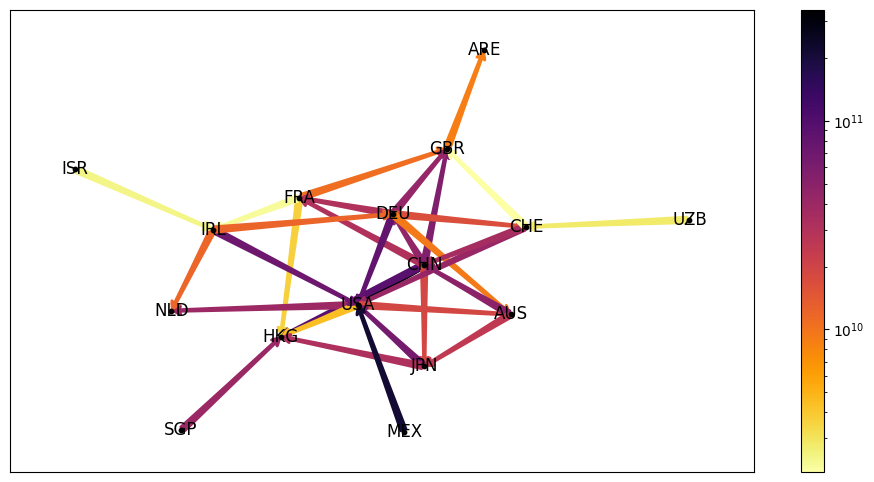

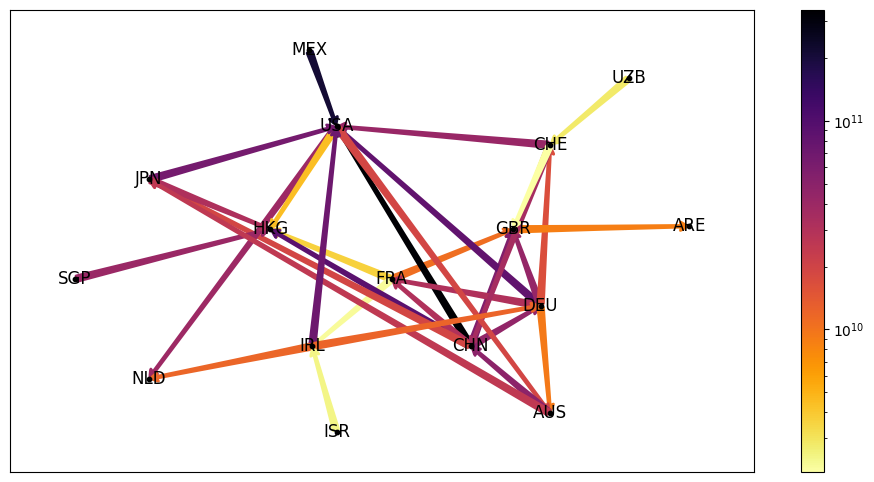

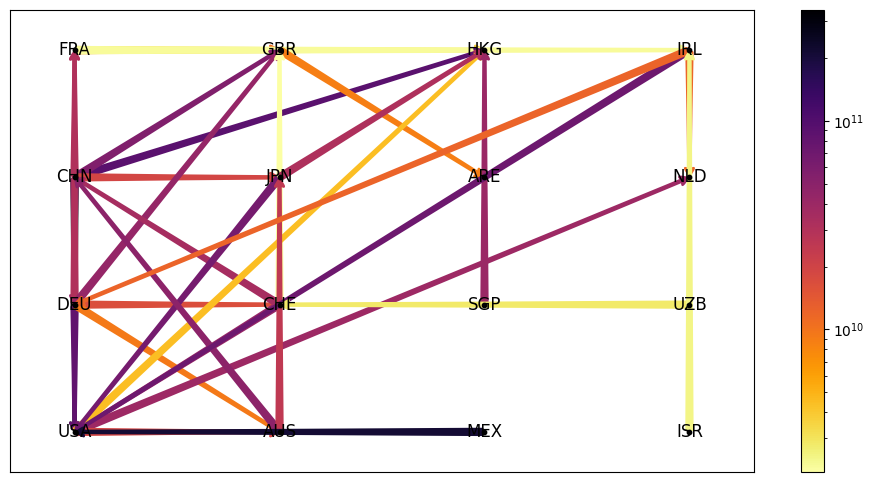

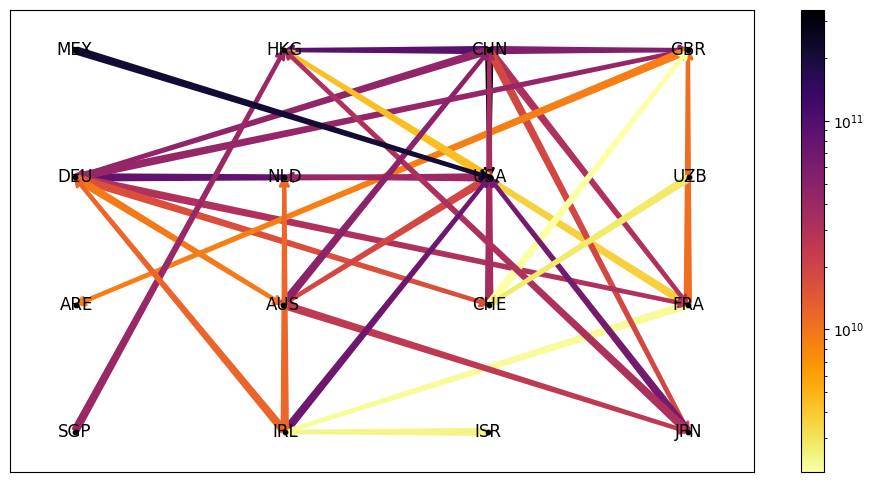

In [14]:
### testing py graphviz positionning
###need pygraphviz, to install it, see https://pygraphviz.github.io/documentation/stable/install.html
for layout in ['dot','neato','twopi','patchwork','osage']:
    pos = nx.nx_agraph.graphviz_layout(G, prog=layout,root=ISO)
    network_figure(G,pos,cmap)#



In [15]:
ISO='USA'
###for a given country top X most importants countries in balance, compute the relative importance of those countries

Q_neg,Q_pos=find_topN_relations(Df_product,ISO,100)

Q_neg['pct']=Q_neg[mycol]/Q_neg[mycol].abs().sum()*100
Q_pos['pct']=Q_pos[mycol]/Q_pos[mycol].abs().sum()*100

Q_neg[['reporterISO','partnerISO',mycol,'pct']]

central_ISO=ISO
n_level=2
n_nodes=2
### STEP 1 :find all connection of interest (pairs)
queue_ISO=[central_ISO]
passed_ISO=[]
pairs=[]

childs=[]

i=0
while i<n_level:
    for ISO in list(queue_ISO):
        print('actual queue',queue_ISO)
        print('current ISO:', ISO)

        Df_neg,Df_pos=find_topN_relations(Df,ISO,n_nodes)
        pos_ISO=Df_pos['partnerISO'].to_list()
        neg_ISO=Df_neg['partnerISO'].to_list()

        new_ISO=pos_ISO+neg_ISO
        for iso in new_ISO:
            queue_ISO.append(iso)

        passed_ISO.append(ISO) #all the country already seen
        for iso in passed_ISO:
            if iso in queue_ISO:
                queue_ISO.remove(iso)

        print(f'{ISO} has positive balance with {pos_ISO}')
        print(f'{ISO} has negative balance with {neg_ISO}')
        print('passed queue', passed_ISO)        
    
        new_pairs=list(zip([ISO]*n_nodes*2, pos_ISO+neg_ISO))
        print('new pairs',new_pairs)
        for pair in new_pairs:
            pairs.append(pair)

        childs.append(new_ISO)
    i+=1                   



print('parent',passed_ISO)
print('child',childs)
print('pair',pairs)

actual queue ['USA']
current ISO: USA
USA has positive balance with ['NLD', 'HKG']
USA has negative balance with ['CHN', 'MEX']
passed queue ['USA']
new pairs [('USA', 'NLD'), ('USA', 'HKG'), ('USA', 'CHN'), ('USA', 'MEX')]
actual queue ['NLD', 'HKG', 'CHN', 'MEX']
current ISO: NLD
NLD has positive balance with ['DEU', 'FRA']
NLD has negative balance with ['CHN', 'USA']
passed queue ['USA', 'NLD']
new pairs [('NLD', 'DEU'), ('NLD', 'FRA'), ('NLD', 'CHN'), ('NLD', 'USA')]
actual queue ['HKG', 'CHN', 'MEX', 'DEU', 'FRA', 'CHN']
current ISO: HKG
HKG has positive balance with ['CHN', 'USA']
HKG has negative balance with ['SGP', 'JPN']
passed queue ['USA', 'NLD', 'HKG']
new pairs [('HKG', 'CHN'), ('HKG', 'USA'), ('HKG', 'SGP'), ('HKG', 'JPN')]
actual queue ['CHN', 'MEX', 'DEU', 'FRA', 'CHN', 'CHN', 'SGP', 'JPN']
current ISO: CHN
CHN has positive balance with ['USA', 'HKG']
CHN has negative balance with ['AUS', 'CHE']
passed queue ['USA', 'NLD', 'HKG', 'CHN']
new pairs [('CHN', 'USA'), ('CHN

In [273]:
start_ISO='FRA'
n_nodes=4
n_level=2



def make_network_pct(Df,n_nodes,n_level,start_ISO):
#this is different from make_network as a) no harmonization is made, meaning 1->2 is not always as minus 2->1
# and b) relative importance of relation 1->2 for country 1 (in percentage)     

    Df=filter_df(Df,'partnerISO',iso_ok) #do not consider 'world' as a partner


    queue_ISO=[start_ISO]
    passed_ISO=[]
#    pairs=[]
    Q=pd.DataFrame() # where results are collected

    i=0
    while i<n_level:
        for ISO in list(queue_ISO):
            #print('actual queue',queue_ISO)
            #print('current ISO:', ISO)
            Df_acountry=filter_df(Df,'reporterISO',ISO)
            Df_country_marchandise=filter_df(Df_acountry,'cmdCode',[commodity]) #choos a type of marchandise
            q_sorted=Df_country_marchandise.sort_values(by=mycol,key=lambda x: np.abs(x),ascending=False)# s
            q_sorted['pct']=q_sorted[mycol].abs()/np.sum(q_sorted[mycol].abs())

            q_sorted_topn=q_sorted.head(n_nodes)

            new_ISO=q_sorted_topn['partnerISO'].to_list()
        
            for iso in new_ISO: # add new ISO to the searching list
                queue_ISO.append(iso)

            passed_ISO.append(ISO) #all the country already seen
            for iso in passed_ISO:
                if iso in queue_ISO:
                    queue_ISO.remove(iso)

            Q=pd.concat([Q,q_sorted_topn])
        i=i+1    


    G=nx.from_pandas_edgelist(Q[['reporterISO','partnerISO',mycol,'pct']],
                            'reporterISO','partnerISO',
                            edge_attr=[mycol,'pct'],
                            create_using=nx.DiGraph())

    return G

G=make_network_pct(Df=Df,n_level=n_level,n_nodes=n_nodes,start_ISO=start_ISO)

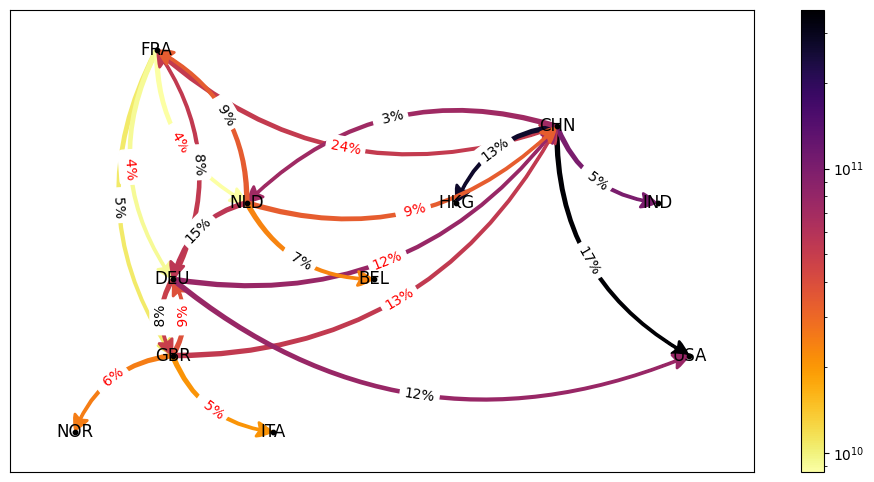

In [17]:


def network_figure_pct(G,pos=None,cmap=None):

    if pos is None:
        start_ISO=list(G.nodes)[0] 
        pos = nx.nx_agraph.graphviz_layout(G, prog='dot',root=start_ISO)

    if cmap is None:
        cmap=plt.cm.coolwarm_r

    Size=[G.edges[pair][mycol] for pair in list(G.edges())]
    min_val=np.min(np.abs(Size))
    max_val=np.max(np.abs(Size))
    Size=np.abs(Size)/max_val
    Size=np.log10(Size)

    fig,ax=plt.subplots(figsize=(12,6))
    net=nx.draw_networkx(G,
                        edge_cmap=cmap,
                        edge_color=Size,
                        node_color='k',
                        node_size=10,
                        width=2,#Size*4,
                        arrowstyle=ArrowStyle('fancy',head_length=1, head_width=1, tail_width=.2),
                        #arrowstyle=ArrowStyle('wedge', tail_width=.3,shrink_factor=.8),
                        pos=pos,
                        connectionstyle='arc3,rad=.3'# connection style in matplotlib
                        )

    ### add attribute 'pct' in edges
    attr='pct'
    labels={}
    for edge in list(G.edges()):
        labels[edge]='{:2.0f}'.format(G.edges[edge][attr]*100)+'%'

    #color can NOT be a list so one must run a loop for every edge
    for edge in list(G.edges()):
        color='k'
        if G.edges[edge][mycol]<0:
            color='r'
        nx.draw_networkx_edge_labels(G,pos=pos,
                                edge_labels={edge:labels[edge]},
                                connectionstyle='arc3,rad=0.3',
                                font_color=color
                                )


    color_norm = mpl.colors.LogNorm(vmin=min_val, vmax=max_val)
    fig.colorbar(mpl.cm.ScalarMappable(norm=color_norm,cmap=cmap),
                 ax=ax)

network_figure_pct(G,pos=None,cmap=cmap)

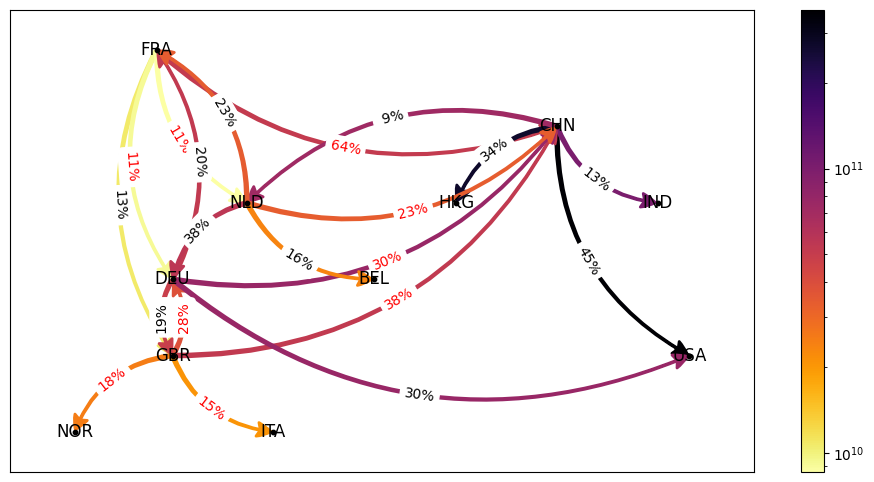

In [285]:
#if G.edges(ISO) is empty then iso is an end node!
def normalize_pct(G):
    #let suppose a country is only connected those in G.edges(ISO)
    # then relative strenght in percentage is pct/sum(pct)

    for ISO in G.nodes:
        C=dict()
        for edge in G.edges(ISO):
            pct=G.edges[edge]['pct']
            C[edge]=pct

        norm=sum(C.values())

        for key in C.keys():
            G.edges[key]['pct']=C[key]/norm

    return(G)

G_norm=normalize_pct(G)

network_figure_pct(G_norm,pos=None,cmap=cmap)

In [324]:

def compute_rank(G):
    '''
    this is pagerank algorithm but adapted for graph
    and with a wieght on edges
    I fill something if odd
    '''
    nodes=G.nodes()
    PR_parent=dict.fromkeys(nodes,1/len(nodes))# initialize
    alpha=.85

    G=normalize_pct(G)
    endnodes=[node for node in G if G.out_degree(node)==0]

    acc=1
    while acc>1e-5:
        PR_child= dict.fromkeys(nodes, 0)# initialize child
        #see https://cs50.harvard.edu/ai/projects/2/pagerank/
        # however this is a bit different, in cs50 ai, rank of a page is
        for iso1 in nodes:
            

            #compute the 2nd right term, this is the 'sum on parent'
            for edge in G.edges(iso1,data='pct'):
                iso2=edge[1]
                wei=edge[2]
                numlink=len(G.edges(iso1))
                #with proba alpha choose one of the edge, which has a weight wei (wei=1 in cs50ai project)
                PR_child[iso2]+=wei*PR_parent[iso1]*alpha/numlink    

            #compute the 1st right term
            PR_child[iso1]+=(1-alpha)*1/len(nodes)# have a change 1-a to choose among all nodes
                    
            ##add additional weight because endnodes exists ; this is not in cs50 ai.. but i think this is correct
            PR_child[iso1]+=alpha/len(nodes)*sum(PR_parent[endnode] for endnode in endnodes)/len(endnodes)

    #
        #normalize child pagerank
        norm=sum(PR_child.values())
        for node in nodes:
            PR_child[node]=PR_child[node]/norm

        err=[]
        for node in nodes:
            dif=abs(PR_parent[node]-PR_child[node])
            err.append(dif)
        acc=sum(err)

        PR_parent=PR_child #update the parent

    return PR_parent


In [340]:
ISOrank=compute_rank(G)
L=sorted(ISOrank,key=ISOrank.get,reverse=True)
for l in L:
    print(l,'{:.2f}'.format(ISOrank[l]*100))

CHN 14.96
USA 12.51
DEU 10.15
HKG 9.44
FRA 8.67
GBR 8.17
NLD 7.64
IND 7.39
NOR 7.14
ITA 6.97
BEL 6.96
